In [2]:
import Script.Image as Image
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

# ALGORITHMS

## 1. INDEX-BASED

In [6]:
filepath1 = "../Sentinel-2/Validation/2020_01_07/L2A_07012020_60.tif"
img_070120 = Image.make_dataset(filepath1)

In [45]:
from rasterio.plot import show
import numpy as np
import rasterio
from scipy import stats
from mpl_toolkits.axes_grid1.axes_rgb import RGBAxes

raster = rasterio.open(filepath1)

R = raster.read(4)
G = raster.read(3)
B = raster.read(2)

'''
R = np.nan_to_num(raster.read(4),1)
G = np.nan_to_num(raster.read(3),1)
B = np.nan_to_num(raster.read(2),1)
'''

def normalize(array):
    """Normalizes numpy arrays into scale 0.0 - 1.0"""
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min))*255
R = normalize(R)
G = normalize(G)
B = normalize(B)

'''
rgb = np.dstack((Rn, Gn, Bn))
rgb2 = [Rn,Gn,Bn]

bbox = [i for i in raster.bounds]

plt.imshow(rgb, transform = raster.transform)
show(raster)
img = pimg.fromarray(np.array(rgb2))
plt.scatter(village_1['POINT_X'],village_1['POINT_Y'], color = 'red', marker = 'x')
plt.tick_params(axis='x', which='major', labelsize=30)
plt.tick_params(axis='y', which='major', labelsize=30)

fig = plt.figure(figsize=(50,50),frameon=False)
pl1 = plt.imshow(R,cmap='Reds')
pl2 = plt.imshow(G,cmap='Greens')
pl3 = plt.imshow(B,cmap='Blues')
plt.show()

raster = rasterio.open(filepath1)
show((raster,2,3,4), transform=raster.transform)
'''
nrg = np.dstack((R,G,B))
show(nrg)

TypeError: _dstack_dispatcher() takes 1 positional argument but 3 were given

### NDWI

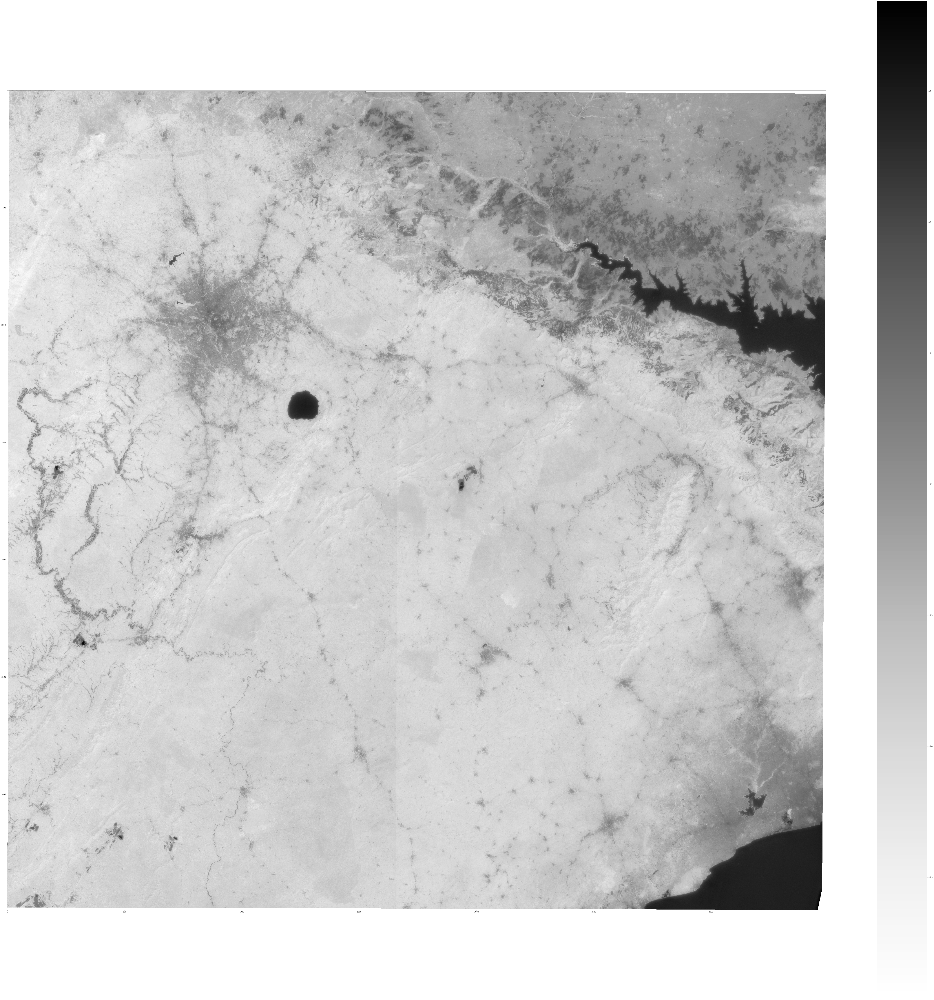

In [3]:
## NDWI threshold
ndwi = Image.show_img(img_07012020, 'NDWI')

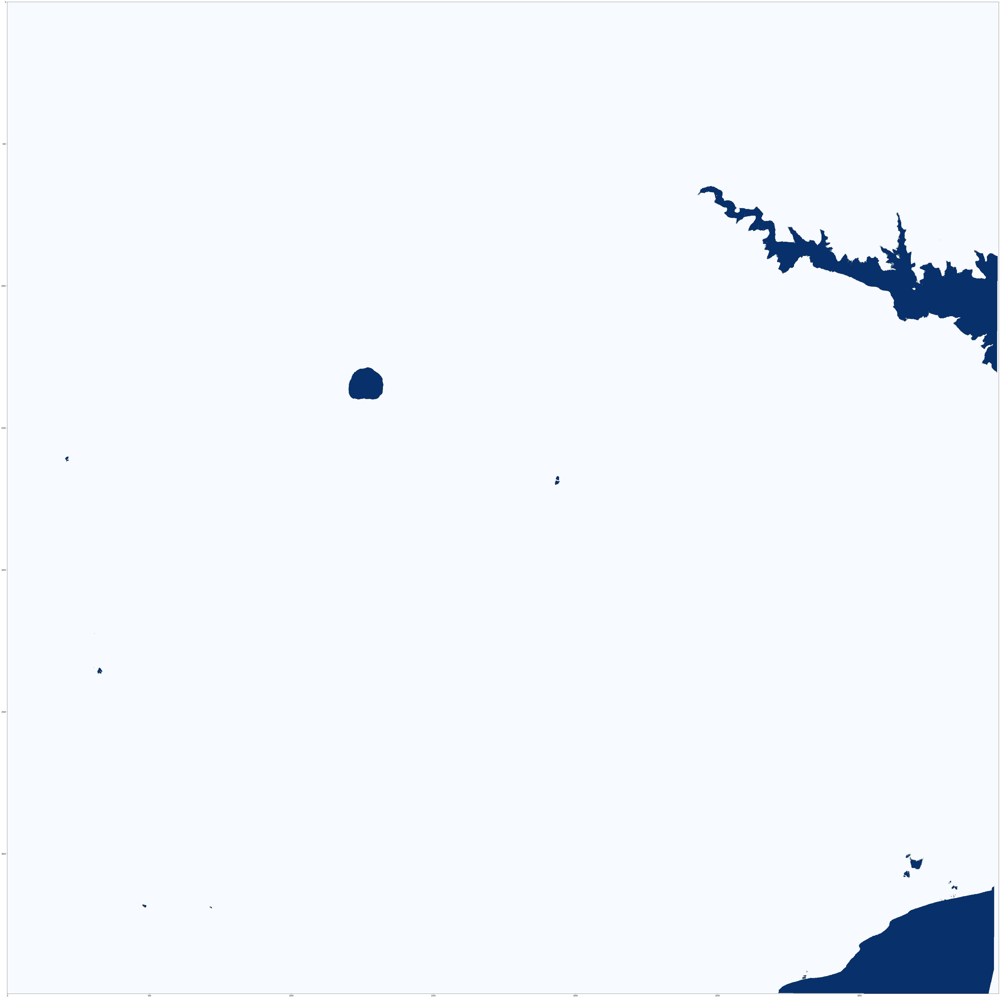

In [4]:
t_ndwi = Image.threshold(img_07012020['df']['NDWI'], img_07012020['dim'] )

## SUPERVISED LEARNING

In [4]:
from rasterio.plot import show_hist
>>> show_hist(
...     src, bins=50, lw=0.0, stacked=False, alpha=0.3,
...     histtype='stepfilled', title="Histogram")

 ## UNSUPERVISED LEARNING: KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

KNN = KNeighborsClassifier()
KNN.fit(X, Y);

In [ ]:
pred_knn = KNN.predict(t)

In [ ]:
sh = pred_knn.reshape(img_27012020['dim'])
plt.figure(figsize=(100,100))
plt.imshow(sh, cmap = 'terrain')

## VALIDATION

In [53]:
z = pred[df_27012020.index] == df_27012020.Content
print("Accuracy of LR is = " + str(np.count_nonzero(z)*100/len(z)) + "%")

Accuracy is = 84.11949614419142%


In [54]:
z = pred_rf[df_27012020.index] == df_27012020.Content
print("Accuracy of RF is = " + str(np.count_nonzero(z)*100/len(z)) + "%")

Accuracy of RF is = 83.97991813473845%


In [59]:
z = pred_dt[df_27012020.index] == df_27012020.Content
print("Accuracy of RF is = " + str(np.count_nonzero(z)*100/len(z)) + "%")

Accuracy of RF is = 83.2368891200615%


In [44]:
z = pred_knn[df_27012020.index] == df_27012020.Content
print("Accuracy of KNN is = " + str(np.count_nonzero(z)*100/len(z)) + "%")

Accuracy of KNN is = 82.96849770460662%


In [53]:
z = t_ndwi.flatten()[df_27012020.index] != df_27012020.Content
print("Accuracy of NDWI baseline is = " + str(np.count_nonzero(z)*100/len(z)) + "%")

Accuracy of NDWI baseline is = 84.65374612723038%


In [13]:
households = pd.read_csv('Household/Households.csv')

In [21]:
max(households.POINT_X)
min(households.POINT_X)
max(households.POINT_Y)
min(households.POINT_Y)

5.732792494780001

In [22]:
households.head()

,Unnamed: 0,POINT_X,POINT_Y
0,0,-1.507044,6.945968
1,1,-1.506555,6.946493
2,2,-1.506830,6.946272
3,3,-1.507201,6.946480
4,4,-1.506835,6.946687


,Unnamed: 0,POINT_X,POINT_Y
0,0,-1.507044,6.945968
1,1,-1.506555,6.946493
2,2,-1.506830,6.946272
3,3,-1.507201,6.946480
4,4,-1.506835,6.946687
...,...,...,...
281,281,-1.510409,6.954040
282,282,-1.510109,6.953922
283,283,-1.510218,6.954410
284,284,-1.510039,6.954461


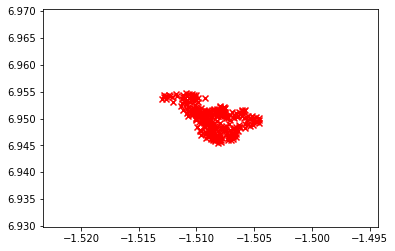

In [45]:
plt.scatter(village_1['POINT_X'],village_1['POINT_Y'], color = 'red', marker = 'x')
plt.show()

In [52]:
raster.crs.wkt

'GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'

In [84]:
bbox

[0.0005448620438289056,
 -2.0977448279917863,
 -0.0005448620438289056,
 7.23719906632963]

In [107]:
X = np.linspace(bbox[2],bbox[0],raster.width)
Y = np.linspace(bbox[1],bbox[3],raster.height)
coord = [[(x,y) for x in X] for y in Y]

In [28]:
np.unique(rgb)

array([0.        , 0.09603211, 0.09770439, ..., 0.99171734, 0.9918463 ,
       1.        ], dtype=float32)